In [0]:
import numpy as np
from pyspark.sql import SparkSession
import pyspark.pandas as pd
from pyspark.sql.functions import *
from pyspark.ml.feature import *
from pyspark.ml.linalg import *
import matplotlib.pyplot as plt
import seaborn as sns

https://archive.ics.uci.edu/dataset/502/online+retail+ii

### dataset link

In [0]:
spark = SparkSession.builder.appName("Spark DataFrames").getOrCreate()

In [0]:
spark

In [0]:
df = spark.sql("SELECT * FROM hive_metastore.default.online_retail_ii")
df.display()

Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country
562955,23197,SKETCHBOOK MAGNETIC SHOPPING LIST,2,11/8/2011 10:14,"3,29",null,United Kingdom
562955,23199,JUMBO BAG APPLES,33,11/8/2011 10:14,"4,13",null,United Kingdom
562955,23229,VINTAGE DONKEY TAIL GAME,1,11/8/2011 10:14,"7,46",null,United Kingdom
562955,23235,STORAGE TIN VINTAGE LEAF,1,11/8/2011 10:14,"5,79",null,United Kingdom
562955,23241,TREASURE TIN GYMKHANA DESIGN,2,11/8/2011 10:14,"4,13",null,United Kingdom
562955,23243,SET OF TEA COFFEE SUGAR TINS PANTRY,3,11/8/2011 10:14,"10,79",null,United Kingdom
562955,23245,SET OF 3 REGENCY CAKE TINS,4,11/8/2011 10:14,"10,79",null,United Kingdom
562955,23254,CHILDRENS CUTLERY DOLLY GIRL,1,11/8/2011 10:14,"8,29",null,United Kingdom
562955,23283,DOORMAT VINTAGE LEAF,1,11/8/2011 10:14,"15,79",null,United Kingdom
562955,23284,DOORMAT KEEP CALM AND COME IN,7,11/8/2011 10:14,"15,79",null,United Kingdom


## Data analysis

In [0]:
from pyspark.sql.functions import to_timestamp

df = df.withColumn('InvoiceDate', to_timestamp('InvoiceDate', 'dd/M/yyyy HH:mm'))
df.show()
# I had to chage my data ype to timestamp and use de function to_timestamp because it was not recognizing the date

+-------+---------+--------------------+--------+-------------------+-----+-----------+--------------+
|Invoice|StockCode|         Description|Quantity|        InvoiceDate|Price|Customer ID|       Country|
+-------+---------+--------------------+--------+-------------------+-----+-----------+--------------+
| 562955|    23197|SKETCHBOOK MAGNET...|       2|2011-08-11 10:14:00| 3,29|       NULL|United Kingdom|
| 562955|    23199|    JUMBO BAG APPLES|      33|2011-08-11 10:14:00| 4,13|       NULL|United Kingdom|
| 562955|    23229|VINTAGE DONKEY TA...|       1|2011-08-11 10:14:00| 7,46|       NULL|United Kingdom|
| 562955|    23235|STORAGE TIN VINTA...|       1|2011-08-11 10:14:00| 5,79|       NULL|United Kingdom|
| 562955|    23241|TREASURE TIN GYMK...|       2|2011-08-11 10:14:00| 4,13|       NULL|United Kingdom|
| 562955|    23243|SET OF TEA COFFEE...|       3|2011-08-11 10:14:00|10,79|       NULL|United Kingdom|
| 562955|    23245|SET OF 3 REGENCY ...|       4|2011-08-11 10:14:00|10,7

In [0]:

display(df)

Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country
562955,23197,SKETCHBOOK MAGNETIC SHOPPING LIST,2,2011-08-11T10:14:00Z,"3,29",null,United Kingdom
562955,23199,JUMBO BAG APPLES,33,2011-08-11T10:14:00Z,"4,13",null,United Kingdom
562955,23229,VINTAGE DONKEY TAIL GAME,1,2011-08-11T10:14:00Z,"7,46",null,United Kingdom
562955,23235,STORAGE TIN VINTAGE LEAF,1,2011-08-11T10:14:00Z,"5,79",null,United Kingdom
562955,23241,TREASURE TIN GYMKHANA DESIGN,2,2011-08-11T10:14:00Z,"4,13",null,United Kingdom
562955,23243,SET OF TEA COFFEE SUGAR TINS PANTRY,3,2011-08-11T10:14:00Z,"10,79",null,United Kingdom
562955,23245,SET OF 3 REGENCY CAKE TINS,4,2011-08-11T10:14:00Z,"10,79",null,United Kingdom
562955,23254,CHILDRENS CUTLERY DOLLY GIRL,1,2011-08-11T10:14:00Z,"8,29",null,United Kingdom
562955,23283,DOORMAT VINTAGE LEAF,1,2011-08-11T10:14:00Z,"15,79",null,United Kingdom
562955,23284,DOORMAT KEEP CALM AND COME IN,7,2011-08-11T10:14:00Z,"15,79",null,United Kingdom


In [0]:
df.describe().show()
# some problemas, missing data at Costumers ID
# negative price
# negative quantity


+-------+------------------+------------------+--------------------+------------------+------------------+------------------+-----------+
|summary|           Invoice|         StockCode|         Description|          Quantity|             Price|       Customer ID|    Country|
+-------+------------------+------------------+--------------------+------------------+------------------+------------------+-----------+
|  count|            541910|            541910|              540456|            541910|            541910|            406830|     541910|
|   mean| 559965.7926209917|27089.272460352007|             20713.0| 9.552233765754462|29.918516873889875|15287.684160460143|       NULL|
| stddev|13428.437355331731|15977.952954078413|                NULL|218.08095694392964| 595.6794255603494| 1713.603074351475|       NULL|
|    min|            536365|             10002| 4 PURPLE FLOCK D...|            -80995|         -11062,06|             12346|  Australia|
|    max|           C581569|      

In [0]:
spark.conf.set("spark.sql.legacy.timeParserPolicy", "LEGACY")

from pyspark.sql.functions import isnull

# Filter rows where 'Customer ID' is null and display the first 10 rows
df.filter(isnull('Customer ID')).show(10)

+-------+---------+--------------------+--------+-------------------+-----+-----------+--------------+
|Invoice|StockCode|         Description|Quantity|        InvoiceDate|Price|Customer ID|       Country|
+-------+---------+--------------------+--------+-------------------+-----+-----------+--------------+
| 549264|    21337|                NULL|     -21|2011-04-07 12:45:00|    0|       NULL|United Kingdom|
| 549266|    84593|                NULL|      -5|2011-04-07 12:45:00|    0|       NULL|United Kingdom|
| 549267|   46037A|                NULL|      -5|2011-04-07 12:46:00|    0|       NULL|United Kingdom|
| 549268|   84856S|                NULL|      -7|2011-04-07 12:47:00|    0|       NULL|United Kingdom|
| 549271|   62096B|                NULL|      -2|2011-04-07 12:48:00|    0|       NULL|United Kingdom|
| 549270|   84856L|                NULL|     -27|2011-04-07 12:48:00|    0|       NULL|United Kingdom|
| 549295|    16235|RECYCLED PENCIL W...|      15|2011-04-07 19:49:00| 0,4

In [0]:
days_no_ID = df.filter(isnull(df['Customer ID'])).select(['InvoiceDate'])

days_no_ID.groupBy('InvoiceDate').count().orderBy('InvoiceDate').show()

+-------------------+-----+
|        InvoiceDate|count|
+-------------------+-----+
|2010-12-01 11:52:00|    1|
|2010-12-01 14:32:00|  528|
|2010-12-01 14:33:00|    2|
|2010-12-01 14:34:00|    3|
|2010-12-01 14:35:00|    2|
|2010-12-01 14:37:00|    2|
|2010-12-01 14:48:00|    1|
|2010-12-01 15:15:00|    2|
|2010-12-01 16:50:00|    1|
|2010-12-01 17:06:00|  592|
|2010-12-01 17:29:00|    6|
|2010-12-02 11:45:00|   11|
|2010-12-02 14:14:00|   15|
|2010-12-02 14:23:00|   19|
|2010-12-02 14:42:00|    1|
|2010-12-02 14:43:00|    1|
|2010-12-02 15:09:00|    4|
|2010-12-02 16:12:00|   14|
|2010-12-03 11:13:00|   81|
|2010-12-03 11:27:00|   47|
+-------------------+-----+
only showing top 20 rows



In [0]:
df.filter(df['Quantity'] < 0).show(10)
# c indicates cnacelations

+-------+---------+--------------------+--------+-------------------+-----+-----------+--------------+
|Invoice|StockCode|         Description|Quantity|        InvoiceDate|Price|Customer ID|       Country|
+-------+---------+--------------------+--------+-------------------+-----+-----------+--------------+
|C549252|    22665|RECIPE BOX BLUE S...|      -3|2011-04-07 12:18:00| 2,55|      16584|United Kingdom|
|C549252|    22666|RECIPE BOX PANTRY...|      -3|2011-04-07 12:18:00| 2,55|      16584|United Kingdom|
|C549252|    22667|RECIPE BOX RETROS...|      -5|2011-04-07 12:18:00| 2,55|      16584|United Kingdom|
|C549253|    22727|ALARM CLOCK BAKEL...|      -1|2011-04-07 12:20:00| 3,75|      12408|       Belgium|
|C549253|    22725|ALARM CLOCK BAKEL...|      -1|2011-04-07 12:20:00| 3,75|      12408|       Belgium|
|C549253|    20712|JUMBO BAG WOODLAN...|      -1|2011-04-07 12:20:00| 2,08|      12408|       Belgium|
|C549253|    22466|FAIRY TALE COTTAG...|      -1|2011-04-07 12:20:00| 1,9

In [0]:
digitis = df.filter(df['Invoice'].rlike(r'[A-Za-z]'))
display(digitis)

Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country
C549252,22665,RECIPE BOX BLUE SKETCHBOOK DESIGN,-3,2011-04-07T12:18:00Z,"2,55",16584,United Kingdom
C549252,22666,RECIPE BOX PANTRY YELLOW DESIGN,-3,2011-04-07T12:18:00Z,"2,55",16584,United Kingdom
C549252,22667,RECIPE BOX RETROSPOT,-5,2011-04-07T12:18:00Z,"2,55",16584,United Kingdom
C549253,22727,ALARM CLOCK BAKELIKE RED,-1,2011-04-07T12:20:00Z,"3,75",12408,Belgium
C549253,22725,ALARM CLOCK BAKELIKE CHOCOLATE,-1,2011-04-07T12:20:00Z,"3,75",12408,Belgium
C549253,20712,JUMBO BAG WOODLAND ANIMALS,-1,2011-04-07T12:20:00Z,"2,08",12408,Belgium
C549253,22466,FAIRY TALE COTTAGE NIGHTLIGHT,-1,2011-04-07T12:20:00Z,"1,95",12408,Belgium
C549253,22328,ROUND SNACK BOXES SET OF 4 FRUITS,-1,2011-04-07T12:20:00Z,"2,95",12408,Belgium
C549254,82494L,WOODEN FRAME ANTIQUE WHITE,-1,2011-04-07T12:21:00Z,"2,95",13769,United Kingdom
C549265,22364,GLASS JAR DIGESTIVE BISCUITS,-3,2011-04-07T12:45:00Z,"2,95",16245,United Kingdom


In [0]:
from pyspark.sql.functions import regexp_replace
only_alpha = digitis.withColumn('Invoice', regexp_replace(digitis['Invoice'], r'\d', ''))
display(only_alpha.groupBy(['Invoice']).count())

Invoice,count
C,9288
A,3


In [0]:
df.filter(df['Invoice'].rlike(r'^A')).show()
# strange, bad things

+-------+---------+---------------+--------+-------------------+---------+-----------+--------------+
|Invoice|StockCode|    Description|Quantity|        InvoiceDate|    Price|Customer ID|       Country|
+-------+---------+---------------+--------+-------------------+---------+-----------+--------------+
|A563185|        B|Adjust bad debt|       1|2011-08-12 14:50:00| 11062,06|       NULL|United Kingdom|
|A563186|        B|Adjust bad debt|       1|2011-08-12 14:51:00|-11062,06|       NULL|United Kingdom|
|A563187|        B|Adjust bad debt|       1|2011-08-12 14:52:00|-11062,06|       NULL|United Kingdom|
+-------+---------+---------------+--------+-------------------+---------+-----------+--------------+



In [0]:
df.filter( df['StockCode'].rlike(r'^\d{5}$') == False).show()
# Seam legit


+-------+---------+--------------------+--------+-------------------+-----+-----------+--------------+
|Invoice|StockCode|         Description|Quantity|        InvoiceDate|Price|Customer ID|       Country|
+-------+---------+--------------------+--------+-------------------+-----+-----------+--------------+
| 549246|   85169C|EAU DE NIL LOVE B...|     100|2011-04-07 12:02:00| 1,06|      15939|United Kingdom|
| 549246|   72351B|SET/6 PINK  BUTTE...|     100|2011-04-07 12:02:00| 1,69|      15939|United Kingdom|
| 549247|   84970L|SINGLE HEART ZINC...|      24|2011-04-07 12:04:00| 0,95|      13752|United Kingdom|
| 549247|   84970S|HANGING HEART ZIN...|      24|2011-04-07 12:04:00| 0,85|      13752|United Kingdom|
| 549249|   79190B|RETRO PLASTIC POL...|      15|2011-04-07 12:04:00| 0,42|      12423|       Belgium|
| 549249|   79191C|RETRO PLASTIC ELE...|      12|2011-04-07 12:04:00| 0,85|      12423|       Belgium|
| 549249|   79190A|RETRO PLASTIC 70'...|      15|2011-04-07 12:04:00| 0,4

In [0]:
filter_stock = df.filter( (df['StockCode'].rlike(r'^[0-9]{5}$') == False )  & ( df['StockCode'].rlike(r'^[0-9]{5}[a-zA-Z]+$') == False))
filter_stock.groupBy('StockCode').count().show()
# exclude 

+------------+-----+
|   StockCode|count|
+------------+-----+
|gift_0001_50|    4|
|gift_0001_20|   10|
|         DOT|  710|
|gift_0001_40|    3|
|        PADS|    4|
|        POST| 1257|
|gift_0001_10|    9|
|    DCGS0004|    1|
|           M|  571|
|   AMAZONFEE|   34|
|           D|   77|
|   DCGSSGIRL|   13|
|    DCGS0069|    2|
|gift_0001_30|    8|
|    DCGS0057|    1|
|           S|   63|
|    DCGS0003|    5|
|    DCGS0074|    1|
|BANK CHARGES|   37|
|    DCGSSBOY|   11|
+------------+-----+
only showing top 20 rows



## Data Cleaning

In [0]:
# cleaning the Invoices 
df_clean_invoice = df.filter(df['Invoice'].rlike(r'^[0-9]{6}'))
df_clean_invoice.describe().show()
df.describe().show()

+-------+------------------+------------------+--------------------+------------------+------------------+------------------+-----------+
|summary|           Invoice|         StockCode|         Description|          Quantity|             Price|       Customer ID|    Country|
+-------+------------------+------------------+--------------------+------------------+------------------+------------------+-----------+
|  count|            532619|            532619|              531165|            532619|            532619|            397925|     532619|
|   mean| 559965.7926209917|   27080.092368237|             20713.0|10.240006458650555|17.318870523415978|15294.308600866998|       NULL|
| stddev|13428.437355331731|15967.461498523495|                NULL| 159.5938499541951| 77.12882462939851|1713.1727375458465|       NULL|
|    min|            536365|             10002| 4 PURPLE FLOCK D...|             -9600|                 0|             12346|  Australia|
|    max|            581587|      

In [0]:
mask = (
    (df_clean_invoice['StockCode'].rlike(r'^[0-9]{5}$'))
    | (df_clean_invoice['StockCode']).rlike(r'^[0-9]{5}[a-zA-Z]+')
    | (df_clean_invoice['StockCode']).rlike(r'PADS')

)
data_clean_stock = df_clean_invoice.filter(mask)
data_clean_stock.describe().show()
df_clean = data_clean_stock

+-------+------------------+------------------+--------------------+------------------+------------------+------------------+-----------+
|summary|           Invoice|         StockCode|         Description|          Quantity|             Price|       Customer ID|    Country|
+-------+------------------+------------------+--------------------+------------------+------------------+------------------+-----------+
|  count|            530214|            530214|              528775|            530214|            530214|            396374|     530214|
|   mean| 559972.5881530853|   27080.092368237|             20713.0|10.256473801144443|  8.41444740346205|15301.603823661491|       NULL|
| stddev|13431.137802836958|15967.461498523495|                NULL|159.89920816447093|31.707511802245545| 1709.976485378889|       NULL|
|    min|            536365|             10002| 4 PURPLE FLOCK D...|             -9600|                 0|             12346|  Australia|
|    max|            581587|      

In [0]:
# removing those strange transactions maybe we had corrected all the estrange transactions
df_clean.describe().show()
# no, strange negative quantite, and price
df_clean = df_clean.withColumn('price', regexp_replace('Price',',','.'))
df_clean = df_clean.withColumn('Price', df_clean['Price'].cast('double'))
df_clean.printSchema()
df_clean.describe().show()

+-------+------------------+------------------+--------------------+------------------+------------------+------------------+-----------+
|summary|           Invoice|         StockCode|         Description|          Quantity|             Price|       Customer ID|    Country|
+-------+------------------+------------------+--------------------+------------------+------------------+------------------+-----------+
|  count|            530214|            530214|              528775|            530214|            530214|            396374|     530214|
|   mean| 559972.5881530853|   27080.092368237|             20713.0|10.256473801144443|  8.41444740346205|15301.603823661491|       NULL|
| stddev|13431.137802836958|15967.461498523495|                NULL|159.89920816447093|31.707511802245545| 1709.976485378889|       NULL|
|    min|            536365|             10002| 4 PURPLE FLOCK D...|             -9600|                 0|             12346|  Australia|
|    max|            581587|      

In [0]:
df_clean = df_clean.na.drop(subset='Customer ID')
df_clean = df_clean.filter(df_clean['Price']>0)
df_clean.describe().show()

+-------+------------------+------------------+--------------------+------------------+-----------------+------------------+-----------+
|summary|           Invoice|         StockCode|         Description|          Quantity|            Price|       Customer ID|    Country|
+-------+------------------+------------------+--------------------+------------------+-----------------+------------------+-----------+
|  count|            396340|            396340|              396340|            396340|           396340|            396340|     396340|
|   mean| 560618.8888605742|26967.475197404478|                NULL|13.012456476762376|2.868200239694417|15301.689069990412|       NULL|
| stddev|13106.340113540778|15676.678406103612|                NULL|179.64056786606605|4.264654135086062| 1709.957486692653|       NULL|
|    min|            536365|             10002| 4 PURPLE FLOCK D...|                 1|            0.001|             12346|  Australia|
|    max|            581587|             

In [0]:
df_clean = df_clean.na.drop(subset='InvoiceDate')
df_clean.describe().show()

+-------+------------------+------------------+--------------------+------------------+-----------------+------------------+-----------+
|summary|           Invoice|         StockCode|         Description|          Quantity|            Price|       Customer ID|    Country|
+-------+------------------+------------------+--------------------+------------------+-----------------+------------------+-----------+
|  count|            396340|            396340|              396340|            396340|           396340|            396340|     396340|
|   mean| 560618.8888605742|26967.475197404478|                NULL|13.012456476762376|2.868200239694417|15301.689069990412|       NULL|
| stddev|13106.340113540778|15676.678406103612|                NULL|179.64056786606605|4.264654135086062| 1709.957486692653|       NULL|
|    min|            536365|             10002| 4 PURPLE FLOCK D...|                 1|            0.001|             12346|  Australia|
|    max|            581587|             

In [0]:
# data lost
ratio = df_clean.count()/df.count()
display(ratio)

0.7313760587551439

In [0]:
from pyspark.sql.functions import col

df_clean = df_clean.withColumn('Total Value', col('Quantity') * col('Price'))
df_clean = df_clean.withColumn('Total Value', round(col('Total Value'), 2))
df_clean.show()
# libras

+-------+---------+--------------------+--------+-------------------+-----+-----------+--------------+-----------+
|Invoice|StockCode|         Description|Quantity|        InvoiceDate|Price|Customer ID|       Country|Total Value|
+-------+---------+--------------------+--------+-------------------+-----+-----------+--------------+-----------+
| 549245|    20723|STRAWBERRY CHARLO...|       5|2011-04-07 12:00:00| 0.85|      15005|United Kingdom|       4.25|
| 549245|    22356|CHARLOTTE BAG PIN...|       6|2011-04-07 12:00:00| 0.85|      15005|United Kingdom|        5.1|
| 549245|    21524|DOORMAT SPOTTY HO...|       1|2011-04-07 12:00:00| 7.95|      15005|United Kingdom|       7.95|
| 549245|    20724|RED RETROSPOT CHA...|       6|2011-04-07 12:00:00| 0.85|      15005|United Kingdom|        5.1|
| 549246|    22087|PAPER BUNTING WHI...|      50|2011-04-07 12:02:00| 2.55|      15939|United Kingdom|      127.5|
| 549246|    21215|IVORY PAPER CUP C...|      24|2011-04-07 12:02:00| 0.55|     

In [0]:
# because the data is old, I used the max data from the set, usaly the curente date
max_data = df_clean.select('InvoiceDate').agg(max('InvoiceDate')).collect()
print(max_data)

[Row(max(InvoiceDate)=datetime.datetime(2011, 12, 9, 12, 50))]


In [0]:
df_RFM = df_clean.groupBy('Customer ID').agg(
    sum('Total Value').alias('Monetary Amount'),
    countDistinct('Invoice').alias('Frequency'),
    max('InvoiceDate').alias('Last Purchase')
    ).withColumn('Monetary Amount', round('Monetary Amount', 2))
df_RFM.show()

+-----------+---------------+---------+-------------------+
|Customer ID|Monetary Amount|Frequency|      Last Purchase|
+-----------+---------------+---------+-------------------+
|      13452|          590.0|        2|2011-03-25 14:19:00|
|      13098|       28882.44|       28|2011-12-08 14:14:00|
|      15194|        7616.53|       15|2011-12-06 15:10:00|
|      13723|         199.85|        1|2011-05-06 17:04:00|
|      15237|        1412.32|        4|2011-12-08 09:46:00|
|      13248|         465.68|        2|2011-08-07 12:40:00|
|      17048|         925.35|        3|2011-08-14 11:49:00|
|      15057|         1489.5|        2|2011-03-09 15:17:00|
|      17043|        1735.18|        4|2011-11-07 15:33:00|
|      17979|         754.31|        4|2011-11-04 12:05:00|
|      18196|         689.13|        2|2011-09-05 16:22:00|
|      14719|        1602.13|        5|2011-12-08 12:43:00|
|      15437|         200.16|        1|2011-03-22 13:11:00|
|      17499|         622.88|        1|2

In [0]:
# because the data is old, I used the max data from the set, usaly the curente date
max_data = df_clean.select('InvoiceDate').agg(max('InvoiceDate')).collect()
print(max_data[0][0])

2011-12-09 12:50:00


In [0]:
df_RFM = df_RFM.withColumn('Recency', datediff(lit(max_data[0][0]), 'Last Purchase'))
df_RFM.show()

+-----------+---------------+---------+-------------------+-------+
|Customer ID|Monetary Amount|Frequency|      Last Purchase|Recency|
+-----------+---------------+---------+-------------------+-------+
|      13452|          590.0|        2|2011-03-25 14:19:00|    259|
|      13098|       28882.44|       28|2011-12-08 14:14:00|      1|
|      15194|        7616.53|       15|2011-12-06 15:10:00|      3|
|      13723|         199.85|        1|2011-05-06 17:04:00|    217|
|      15237|        1412.32|        4|2011-12-08 09:46:00|      1|
|      13248|         465.68|        2|2011-08-07 12:40:00|    124|
|      17048|         925.35|        3|2011-08-14 11:49:00|    117|
|      15057|         1489.5|        2|2011-03-09 15:17:00|    275|
|      17043|        1735.18|        4|2011-11-07 15:33:00|     32|
|      17979|         754.31|        4|2011-11-04 12:05:00|     35|
|      18196|         689.13|        2|2011-09-05 16:22:00|     95|
|      14719|        1602.13|        5|2011-12-0

# graphs

In [0]:
# if it was a massive dataset I will use sample, but for this small dataset it is not necessary
df_koalas = df_RFM.to_koalas()

In [0]:
df_koalas.head()

,Customer ID,Monetary Amount,Frequency,Last Purchase,Recency
0,13452,590.00,2,2011-03-25 14:19:00,259
1,13098,28882.44,28,2011-12-08 14:14:00,1
2,15194,7616.53,15,2011-12-06 15:10:00,3
3,13723,199.85,1,2011-05-06 17:04:00,217
4,15237,1412.32,4,2011-12-08 09:46:00,1


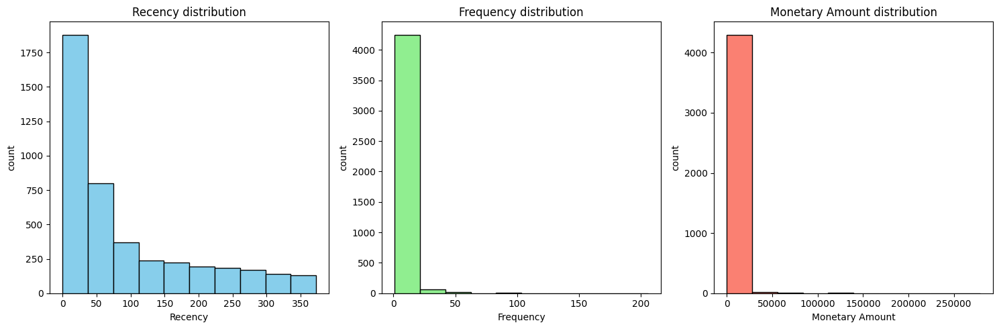

In [0]:
plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
plt.hist(df_koalas['Recency'],bins = 10, color='skyblue', edgecolor='black')
plt.title('Recency distribution')
plt.xlabel('Recency')
plt.ylabel('count')

plt.subplot(1,3,2)
plt.hist(df_koalas['Frequency'],bins = 10, color='lightgreen', edgecolor='black')
plt.title('Frequency distribution')
plt.xlabel('Frequency')
plt.ylabel('count')

plt.subplot(1,3,3)
plt.hist(df_koalas['Monetary Amount'],bins = 10, color='salmon', edgecolor='black')
plt.title('Monetary Amount distribution')
plt.xlabel('Monetary Amount')
plt.ylabel('count')

plt.tight_layout()
plt.show()
# recency seems a good distribution Poisan like
# frequency and monetary amount are not normal, probabli a lot of ouliers

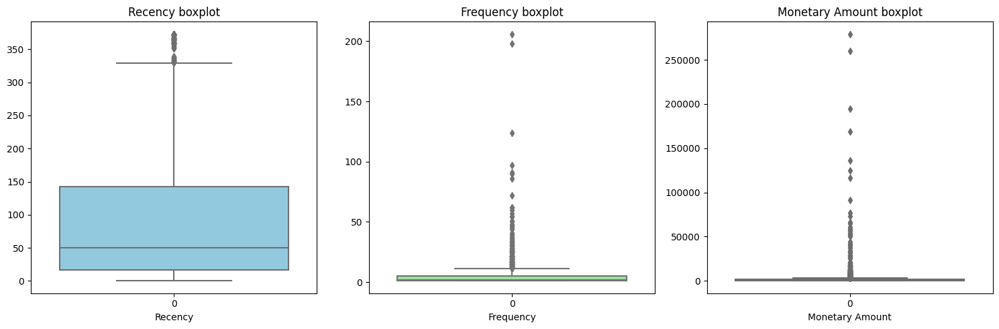

In [0]:
plt.figure(figsize = (15,5))

plt.subplot(1,3,1)
sns.boxplot(data = df_koalas['Recency'].to_numpy(), color='skyblue')
plt.title('Recency boxplot')
plt.xlabel('Recency')

plt.subplot(1,3,2)
sns.boxplot(data = df_koalas['Frequency'].to_numpy(), color='lightgreen')
plt.title('Frequency boxplot')
plt.xlabel('Frequency')

plt.subplot(1,3,3)
sns.boxplot(data = df_koalas['Monetary Amount'].to_numpy(), color='salmon')
plt.title('Monetary Amount boxplot')
plt.xlabel('Monetary Amount')

plt.tight_layout()
plt.show()


In [0]:
# recency outlier seems torelable, but , frequency and Monetary Amount outliers are a lot

In [0]:
df_RFM.printSchema()

root
 |-- Customer ID: long (nullable = true)
 |-- Monetary Amount: double (nullable = true)
 |-- Frequency: long (nullable = false)
 |-- Last Purchase: timestamp (nullable = true)
 |-- Recency: integer (nullable = true)



In [0]:
df_RFM.show(5)
df_RFM.describe().show()

+-----------+---------------+---------+-------------------+-------+
|Customer ID|Monetary Amount|Frequency|      Last Purchase|Recency|
+-----------+---------------+---------+-------------------+-------+
|      13452|          590.0|        2|2011-03-25 14:19:00|    259|
|      13098|       28882.44|       28|2011-12-08 14:14:00|      1|
|      15194|        7616.53|       15|2011-12-06 15:10:00|      3|
|      13723|         199.85|        1|2011-05-06 17:04:00|    217|
|      15237|        1412.32|        4|2011-12-08 09:46:00|      1|
+-----------+---------------+---------+-------------------+-------+
only showing top 5 rows

+-------+------------------+------------------+------------------+------------------+
|summary|       Customer ID|   Monetary Amount|         Frequency|           Recency|
+-------+------------------+------------------+------------------+------------------+
|  count|              4334|              4334|              4334|              4334|
|   mean|   15299.2

In [0]:
# Set the legacy time parser policy
from pyspark.sql.window import Window

# Now proceed with your operations that involve datetime parsing
# Frequency
quantile_frequency_25 = df_koalas['Frequency'].quantile(0.25)
quantile_frequency_75 = df_koalas['Frequency'].quantile(0.75)

# Monetary Amount
quantile_monetary_25 = df_koalas['Monetary Amount'].quantile(0.25)
quantile_monetary_75 = df_koalas['Monetary Amount'].quantile(0.75)

frequency_out_range = ( -1*quantile_frequency_25 + quantile_frequency_75)*1.5 

Monetary_amount_out_range  =( -1*quantile_monetary_25 + quantile_monetary_75)*1.5

# creating idex columns
windowSpec = Window.orderBy('Customer ID')

df_RFM = df_RFM.withColumn('index',row_number().over(windowSpec))

out_liers_frequency_index = df_RFM.filter(

    (col('Frequency') > frequency_out_range + quantile_frequency_75) |
    (col('Frequency') < -1*frequency_out_range + quantile_frequency_25)

 ).select('index').to_koalas()['index'].to_numpy()

out_liers_Monetary_amount_index = df_RFM.filter(
    
    (col('Monetary Amount') > Monetary_amount_out_range + quantile_monetary_75) |
    (col('Monetary Amount') < -1*Monetary_amount_out_range + quantile_monetary_25)
    
    ).select('index').to_koalas()['index'].to_numpy()


In [0]:
from pyspark.sql.functions import col

# Assuming out_liers_frequency_index and out_liers_Monetary_amount_index are lists of integers
# If they are not, you should convert them to integers or ensure they match the data type of 'index' column

df_IQR = df_RFM.filter(
    (col('index').isin([x for x in out_liers_frequency_index]) == False) & 
    (col('index').isin([x for x in out_liers_Monetary_amount_index]) == False)
)

df_IQR.describe().show()

+-------+------------------+-----------------+------------------+------------------+-----------------+
|summary|       Customer ID|  Monetary Amount|         Frequency|           Recency|            index|
+-------+------------------+-----------------+------------------+------------------+-----------------+
|  count|              3863|             3863|              3863|              3863|             3863|
|   mean|15323.852705151437|853.8144162567967|2.7551126067822937|100.47527828112865|2185.399948226767|
| stddev|1709.7317036586169|794.6080997048724|2.1681236966704946|101.85824649657384|1242.365817592765|
|    min|             12348|             3.75|                 1|                 0|                3|
|    max|             18287|          3619.17|                11|               373|             4334|
+-------+------------------+-----------------+------------------+------------------+-----------------+



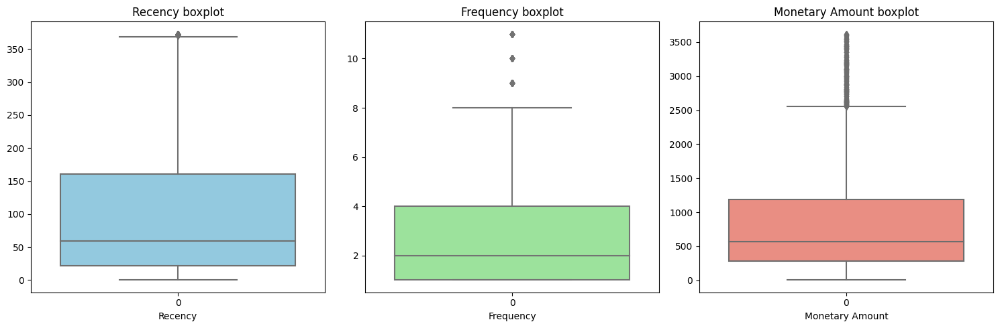

In [0]:
df_IQR_koalas = df_IQR.to_koalas()

plt.figure(figsize = (15,5))

plt.subplot(1,3,1)
sns.boxplot(data = df_IQR_koalas['Recency'].to_numpy(), color='skyblue')
plt.title('Recency boxplot')
plt.xlabel('Recency')

plt.subplot(1,3,2)
sns.boxplot(data = df_IQR_koalas['Frequency'].to_numpy(), color='lightgreen')
plt.title('Frequency boxplot')
plt.xlabel('Frequency')

plt.subplot(1,3,3)
sns.boxplot(data = df_IQR_koalas['Monetary Amount'].to_numpy(), color='salmon')
plt.title('Monetary Amount boxplot')
plt.xlabel('Monetary Amount')

plt.tight_layout()
plt.show()

/databricks/python/lib/python3.10/site-packages/mpl_toolkits/mplot3d/art3d.py:1104: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if zdir == 'x':
/databricks/python/lib/python3.10/site-packages/mpl_toolkits/mplot3d/art3d.py:1106: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  elif zdir == 'y':


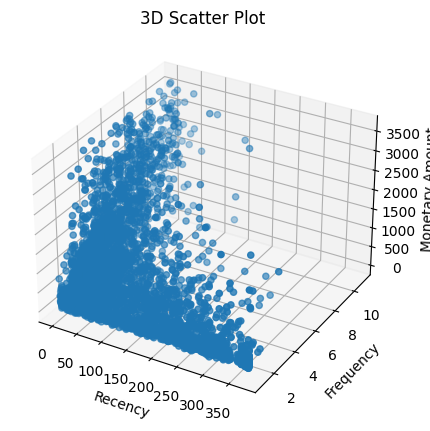

In [0]:
# much Better
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(projection='3d')

scatter = ax.scatter3D(df_IQR_koalas['Recency'].to_numpy(), df_IQR_koalas['Frequency'].to_numpy(), df_IQR_koalas['Monetary Amount'].to_numpy(), df_IQR_koalas['Monetary Amount'].to_numpy())

ax.set_xlabel('Recency')
ax.set_ylabel('Frequency') 
ax.set_zlabel('Monetary Amount')

ax.set_title('3D Scatter Plot')
plt.show()

In [0]:
df_IQR.columns

['Customer ID',
 'Monetary Amount',
 'Frequency',
 'Last Purchase',
 'Recency',
 'index']

In [0]:
# 1. Usar VectorAssembler para criar uma coluna de vetores das features
assembler = VectorAssembler(inputCols=["Monetary Amount", "Frequency", "Recency"], outputCol="features")
df_vector = assembler.transform(df_IQR)

# 2. Aplicar o StandardScaler
scaler = StandardScaler(inputCol="features", outputCol="scaledFeatures", withStd=True, withMean=True)

# Treinar o scaler e transformar os dados
scaler_model = scaler.fit(df_vector)
df_scaled = scaler_model.transform(df_vector)

In [0]:
from pyspark.sql.functions import udf
from pyspark.sql.types import FloatType


extract_feature_1 = udf(lambda v: float(v[0]), FloatType())

extract_feature_2 = udf(lambda v: float(v[1]), FloatType())


extract_feature_3 = udf(lambda v: float(v[2]), FloatType())


df_scaled = df_scaled \
    .withColumn("Feature_m", extract_feature_1(df_scaled["scaledFeatures"])) \
    .withColumn("Feature_f", extract_feature_2(df_scaled["scaledFeatures"])) \
    .withColumn("Feature_r", extract_feature_3(df_scaled["scaledFeatures"]))


df_scaled.select("Feature_m", "Feature_f", "Feature_r").show()


+-----------+----------+-----------+
|  Feature_m| Feature_f|  Feature_r|
+-----------+----------+-----------+
|  0.7342306|0.57417727| -0.2501052|
| 0.75979036|-0.8095076|-0.80970645|
|  -0.704013|-0.8095076|  2.0570226|
| 0.66941875| 1.9578621|-0.63299024|
|-0.96250516|-0.8095076|  1.0163608|
|  0.2838954|-0.8095076|  1.2912526|
|-0.49636346|-0.8095076|  1.1145364|
|  2.0558758|  0.112949|-0.77043617|
| 0.09343673|-0.3482793|-0.97660506|
|  1.8225911|  0.112949| -0.4759092|
| -0.8544016|-0.8095076|  1.8312187|
|  -0.379828|-0.3482793|0.083692014|
| 0.44586203|0.57417727|-0.91769964|
|-0.67092746|-0.8095076|  1.8704889|
|-0.88460517|-0.8095076| -0.9471524|
|   3.236659|0.57417727|-0.48572677|
|  0.8484001|-0.8095076|-0.40718627|
| 0.43068475|  0.112949|-0.28937548|
| -0.6660068|-0.8095076|  2.0668402|
|-0.29056388|-0.8095076| -0.7409835|
+-----------+----------+-----------+
only showing top 20 rows



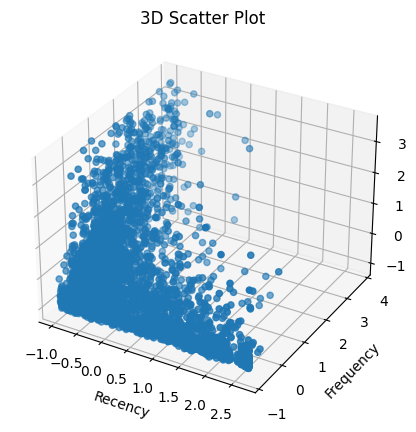

In [0]:
df_scaled_koalas = df_scaled.to_koalas()
# much Better
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(projection='3d')

scatter = ax.scatter3D(df_scaled_koalas['Feature_r'].to_numpy(), df_scaled_koalas['Feature_f'].to_numpy(), df_scaled_koalas['Feature_m'].to_numpy())

ax.set_xlabel('Recency')
ax.set_ylabel('Frequency') 
ax.set_zlabel('Monetary Amount')

ax.set_title('3D Scatter Plot')
plt.show()

In [0]:
df_scaled.printSchema()

root
 |-- Customer ID: long (nullable = true)
 |-- Monetary Amount: double (nullable = true)
 |-- Frequency: long (nullable = false)
 |-- Last Purchase: timestamp (nullable = true)
 |-- Recency: integer (nullable = true)
 |-- index: integer (nullable = false)
 |-- features: vector (nullable = true)
 |-- scaledFeatures: vector (nullable = true)
 |-- Feature_m: float (nullable = true)
 |-- Feature_f: float (nullable = true)
 |-- Feature_r: float (nullable = true)



In [0]:
df_scaled.printSchema()

root
 |-- Customer ID: long (nullable = true)
 |-- Monetary Amount: double (nullable = true)
 |-- Frequency: long (nullable = false)
 |-- Last Purchase: timestamp (nullable = true)
 |-- Recency: integer (nullable = true)
 |-- index: integer (nullable = false)
 |-- features: vector (nullable = true)
 |-- scaledFeatures: vector (nullable = true)
 |-- Feature_m: float (nullable = true)
 |-- Feature_f: float (nullable = true)
 |-- Feature_r: float (nullable = true)



In [0]:
df_scaled_kmeans = df_scaled.select(['Feature_m','Feature_f','Feature_r'])
df_scaled_kmeans_koalas = df_scaled_kmeans.to_koalas()

In [0]:
# vou fazer em koalas
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

k_values = np.arange(2,12)
inercia = np.zeros(10)
silhouette = np.zeros(10)

for i,k in enumerate(k_values):
    k_means = KMeans(n_clusters=k, random_state = 42, max_iter = 1000)
    k_means.fit(df_scaled_kmeans_koalas.to_numpy())
    inercia[i] = k_means.inertia_ 
    silhouette[i] = silhouette_score(df_scaled_kmeans_koalas.to_numpy(),k_means.labels_) 

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f56a82135b0>
Traceback (most recent call last):
  File "/databricks/python/lib/python3.10/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/databricks/python/lib/python3.10/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/databricks/python/lib/python3.10/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/databricks/python/lib/python3.10/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_ca

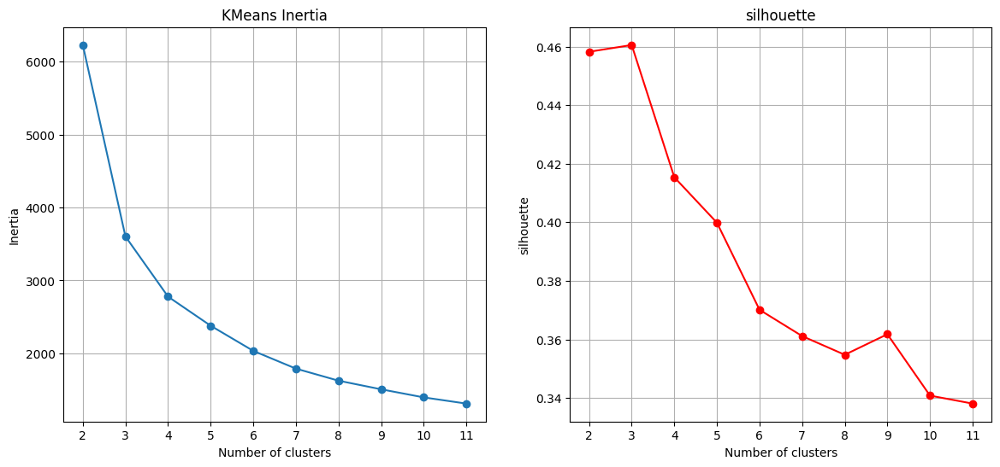

In [0]:
plt.figure(figsize=(14,6)) 

plt.subplot(1,2,1)
plt.plot(k_values,inercia, marker = 'o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('KMeans Inertia')
plt.grid(True)
plt.xticks(k_values)

plt.subplot(1,2,2)
plt.plot(k_values,silhouette, marker = 'o', color = 'red')
plt.xlabel('Number of clusters')
plt.ylabel('silhouette')
plt.title('silhouette')
plt.grid(True)
plt.xticks(k_values)
plt.show()

In [0]:
k_means = KMeans(n_clusters=4, random_state = 10, max_iter = 1000)
model = k_means.fit(df_scaled_kmeans_koalas.to_numpy())

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f56a8211b40>
Traceback (most recent call last):
  File "/databricks/python/lib/python3.10/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/databricks/python/lib/python3.10/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/databricks/python/lib/python3.10/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/databricks/python/lib/python3.10/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_ca

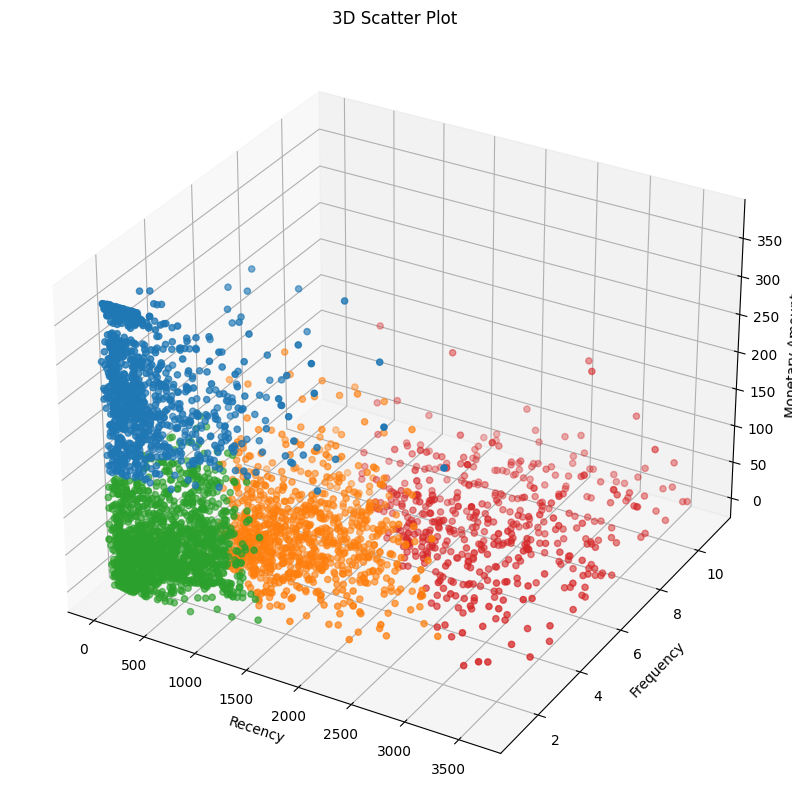

In [0]:
df_scaled_koalas = df_scaled.to_koalas()
# much Better
cluster_colors = {
    0: '#1f77b4',
    1: '#ff7f0e',
    2: '#2ca02c',
    3: '#d62728'
}

colors = [cluster_colors[label] for label in model.labels_]

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(projection='3d')

scatter = ax.scatter3D(zs = df_IQR_koalas['Recency'].to_numpy(),ys=  df_IQR_koalas['Frequency'].to_numpy(), xs = df_IQR_koalas['Monetary Amount'].to_numpy(), c=colors, marker='o')

ax.set_xlabel('Recency')
ax.set_ylabel('Frequency') 
ax.set_zlabel('Monetary Amount')

ax.set_title('3D Scatter Plot')
plt.show()



# interpretate the clusters

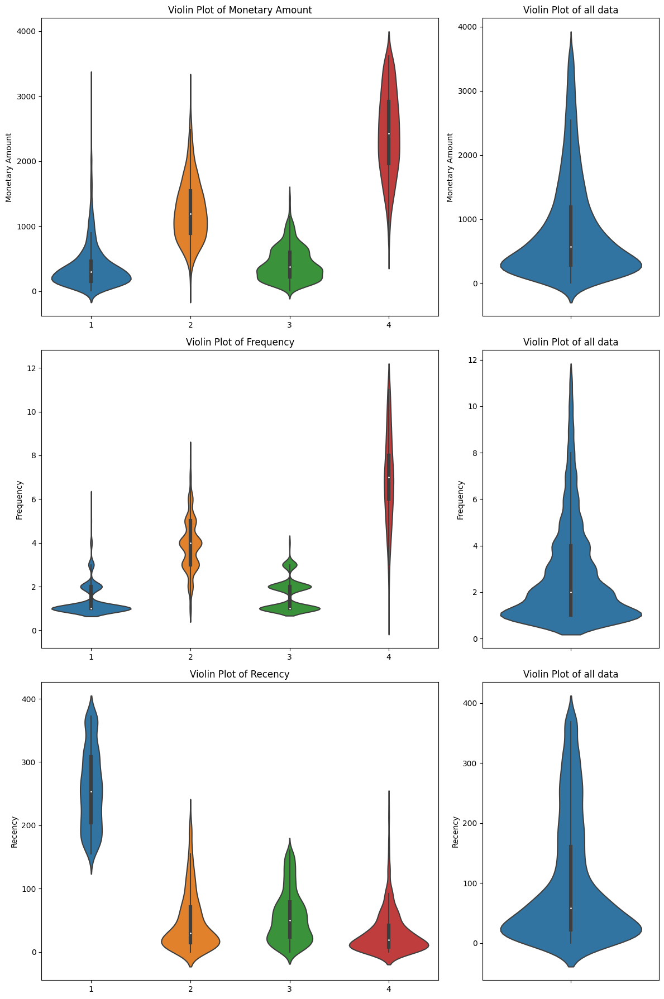

In [0]:
plt.figure(figsize=(12, 18))
cluster_colors = {
    0: '#1f77b4',
    1: '#ff7f0e',
    2: '#2ca02c',
    3: '#d62728'
}
plt.subplot2grid((3, 3), (0, 0), colspan=2)
sns.violinplot(x=model.labels_ + 1, y=df_IQR_koalas['Monetary Amount'].to_numpy(), c=colors)
plt.title('Violin Plot of Monetary Amount')
plt.ylabel('Monetary Amount')

plt.subplot2grid((3, 3), (0, 2), colspan=1)
sns.violinplot( y=df_IQR_koalas['Monetary Amount'].to_numpy(), c=colors)
plt.title('Violin Plot of all data')
plt.ylabel('Monetary Amount')

plt.subplot2grid((3, 3), (1, 0), colspan=2)
sns.violinplot(x=model.labels_ + 1, y=df_IQR_koalas['Frequency'].to_numpy(), c=colors)
plt.title('Violin Plot of Frequency')
plt.ylabel('Frequency')

plt.subplot2grid((3, 3), (1, 2), colspan=1)
sns.violinplot( y=df_IQR_koalas['Frequency'].to_numpy(), c=colors)
plt.title('Violin Plot of all data')
plt.ylabel('Frequency')

plt.subplot2grid((3, 3), (2, 0), colspan=2)
sns.violinplot(x=model.labels_ + 1, y=df_IQR_koalas['Recency'].to_numpy(), c=colors)
plt.title('Violin Plot of Recency')
plt.ylabel('Recency')


plt.subplot2grid((3, 3), (2, 2), colspan=1)
sns.violinplot( y=df_IQR_koalas['Recency'].to_numpy(), c=colors)
plt.title('Violin Plot of all data')
plt.ylabel('Recency')
plt.tight_layout()
plt.show()